<a href="https://colab.research.google.com/github/beimnet777/coffee_disease_image_segmentation/blob/main/Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
import os

In [ ]:
from google.colab.patches import cv2_imshow

In [ ]:
from collections import defaultdict

In [ ]:
def segment_threshold(Path):
  img = cv2.imread(Path)
  # cv2_imshow(img)
  # spliting the images
  img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
  img=cv2.resize(img,(512,256))
  
  a, b, c = cv2.split(img)

  # Gaussian blurring 
  blurred = cv2.GaussianBlur(a, (7, 7), 0)

  # thresholding
  rec,th=cv2.threshold(blurred,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

  # inverting the black and white color
  invert = cv2.bitwise_not(th)

  return invert


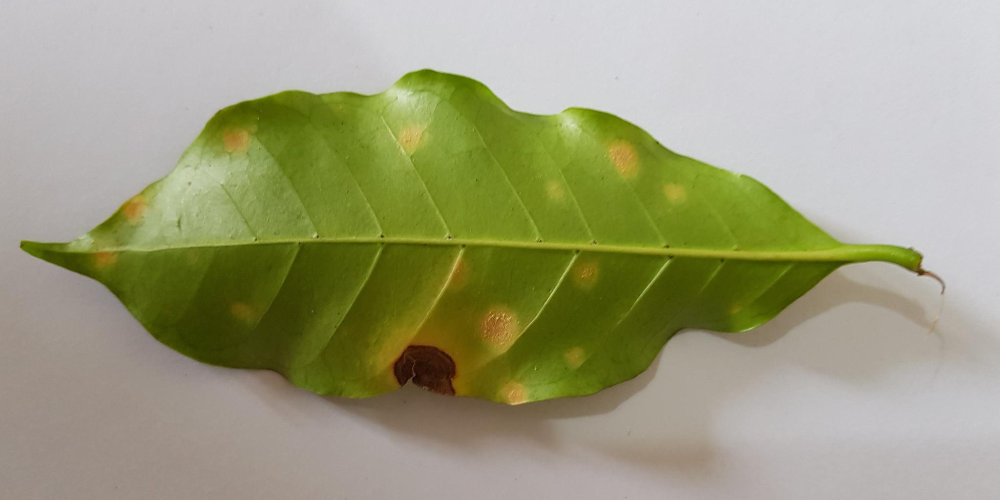

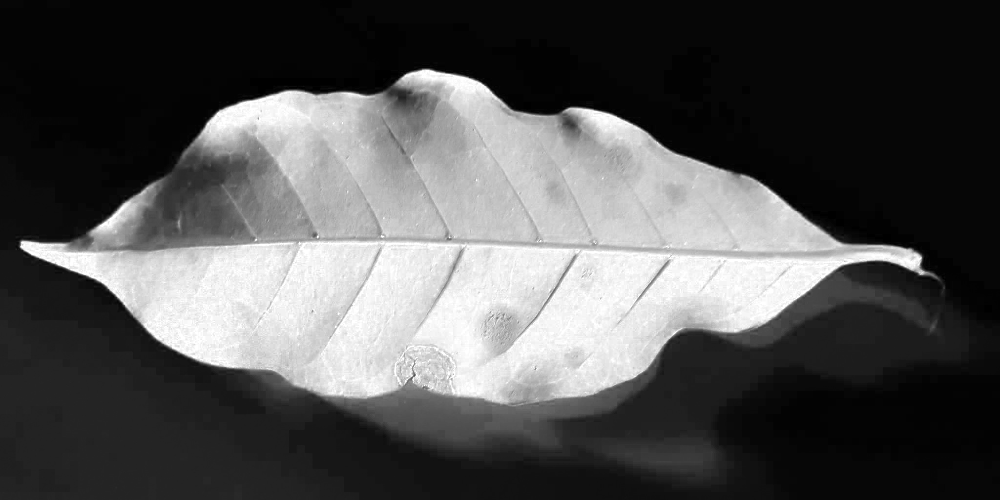

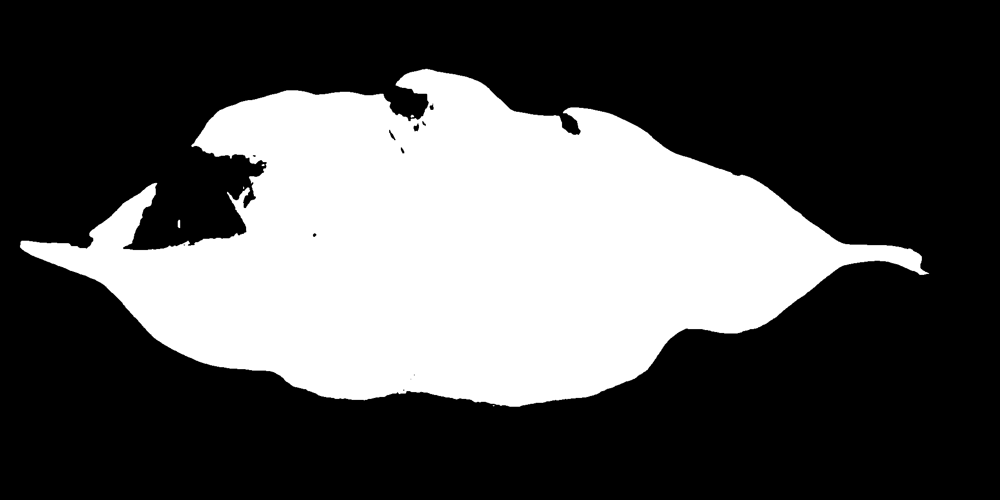

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [ ]:
def inrange_segmentation(path):
  img = cv2.imread(path)
  blank_mask = np.zeros(img.shape, dtype=np.uint8)
  hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
  a, b, c = cv2.split(hsv)
  blurred = cv2.GaussianBlur(b, (7, 7), 0)
  rec,th=cv2.threshold(blurred,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)


  # lower = np.array([18, 42, 69])
  # upper = np.array([179, 255, 255])
  # mask = cv2.inRange(hsv, lower, upper)
  cv2_imshow(img)
  cv2_imshow(b)
  cv2_imshow(th)
  return th
inrange_segmentation("/content/drive/MyDrive/images/val/738.jpg")

In [ ]:
def erosion(th,iteration,dims):
  eroded=cv2.erode(th,np.ones(dims),iterations=iteration)
  # cv2_imshow(eroded)
  return eroded

In [ ]:
def dilation(th,iteration,dims):
  dilated=cv2.dilate(th,np.ones(dims),iterations=iteration)
  # cv2_imshow(dilated)
  return dilated

In [ ]:
def get_mask_files(path):
  dir_map=defaultdict(set)
  for (root,dirs,files) in os.walk("/content/drive/MyDrive/annotations"):
    dir=root.split("/")[-1]
    for file in files:
      num=file.split("_")[0]
      dir_map[dir].add(num)
  return dir_map

In [ ]:
def inrange(path):
  image=cv2.imread(path)
  # cv2_imshow(image)
  blured = cv2.GaussianBlur(image,(1,1),0)
  # Convert RGB image to HSV
  leaf_hsv = cv2.cvtColor(blured,cv2.COLOR_BGR2HSV)
  # Get mask from the S and V channels
  SV_channel = leaf_hsv.copy()
  # Set the H channel to zero
  SV_channel[...,0] = np.zeros((leaf_hsv.shape[0],leaf_hsv.shape[1]))
  # get binary mask
  mask = cv2.inRange(SV_channel,(0,0,80),(0,50,255))
  # Invert mask, White areas represent green components and black the background
  mask = cv2.bitwise_not(mask)
  # cv2_imshow(mask)
  return mask
inrange("/content/drive/MyDrive/dataset/leaf/1338.jpg")

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [ ]:
def change_mask_to_bw(path):
  img = cv2.imread(path)
  gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  (thresh, im_bw) = cv2.threshold(gray_image, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
  return im_bw

In [ ]:
def dice_score(image_1,image_2):
  print(image_1.shape,image_2.shape,"^^^^^^^")
  mask1=(image_1==255)
  mask2=(image_2==255)
  intersect = np.sum(mask1*mask2)
  fsum = np.sum(mask1)
  ssum = np.sum(mask2)
  dice = (2 * intersect ) / (fsum + ssum)
  
  # image_1_np=np.array(image_1)
  # image_2_np=np.array(image_2)
  
  # intersection=np.sum(image_1_np[image_2_np==255])*2.0

  # dice = intersection / (np.sum(image_1_np) + np.sum(image_2_np))
  return dice


In [ ]:
hash_map=get_mask_files("")
print(hash_map)
def walk(path):
  tot=0
  count=0
  for (root,dirs,files) in os.walk("/content/drive/MyDrive/coffee_test_annotations"):
    for file in files:
      exists=False
      dir=None
      num=file.split(".")[0]
      for i in hash_map:
        if num in hash_map[i]:
          exists=True
          dir=i
      if exists:
        image_path=os.path.join("/content/drive/MyDrive/images/",dir,file)
        segment=segment_threshold(image_path)
        segment=dilation(segment,1,(3,3))
        segment=erosion(segment,1,(3,3))
        # cv2_imshow(segment)
        file_mask=str(num)+"_mask.png"

        mask_image_path=os.path.join("/content/drive/MyDrive/annotations",dir,file_mask)
        mask_bw=change_mask_to_bw(mask_image_path)
        # cv2_imshow(mask_bw)
        # imagesList=[mask_bw,segment]
        # figure, axes = plt.subplots(2, 1)   # (columns, rows)    
        # for ax, img in zip(axes, imagesList):  # Iterate over images and
        #   ax.imshow(img)

        score=dice_score(mask_bw,segment)
        print(score)
        tot+=score
        count+=1
  return tot,count
walk("")








defaultdict(<class 'set'>, {'val': {'900', '1676', '528', '20', '1642', '1', '1701', '1117', '693', '266', '1073', '327', '1196', '770', '711', '290', '738', '1562', '610', '416', '766', '441', '239', '390', '1539', '564', '348', '991', '852', '1071', '956', '86', '1514', '64', '43', '679', '1409', '140', '1443', '1012', '618', '167', '482', '1479', '858', '1606', '823', '211', '370', '1033'}, 'test': {'218', '627', '628', '1413', '694', '529', '146', '395', '1105', '291', '1034', '712', '1705', '992', '349', '330', '419', '960', '88', '2', '866', '1383', '242', '68', '446', '268', '680', '1449', '901', '1612', '47', '742', '21', '1481', '1016', '1541', '1517', '792', '443', '1680', '771', '862', '1573', '1643', '1074', '371', '1201', '566', '828', '488'}, 'train': {'55', '1407', '408', '575', '1028', '941', '583', '640', '160', '981', '884', '95', '353', '1581', '1695', '1637', '1624', '1495', '1699', '754', '60', '582', '735', '867', '556', '855', '54', '717', '1742', '58', '1088', '

(493.55239573404003, 500)

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/085931.jpg


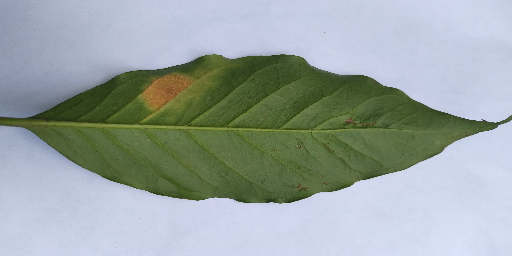

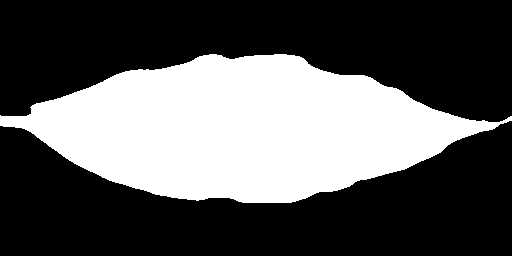

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/085947.jpg


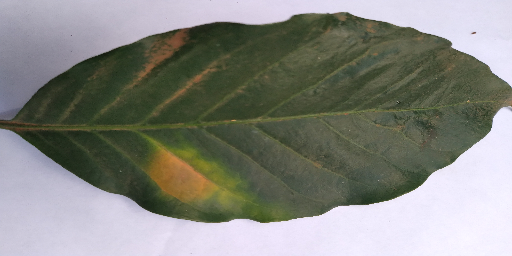

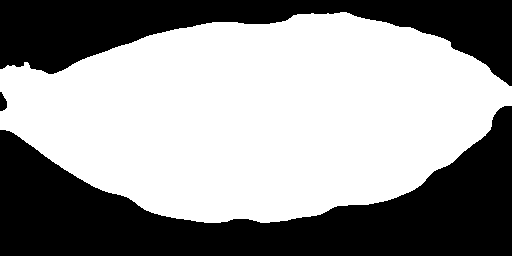

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/90023.jpg


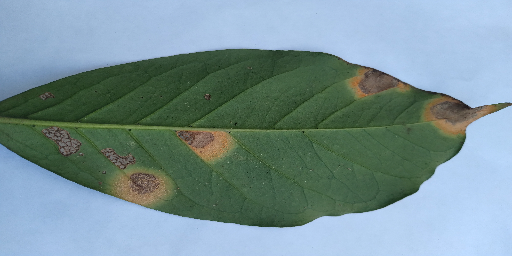

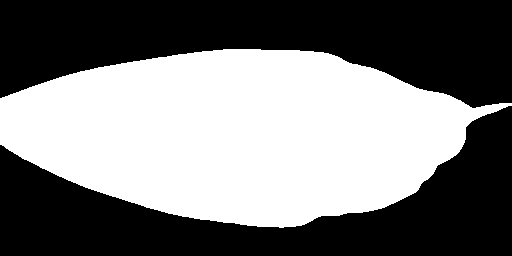

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090032.jpg


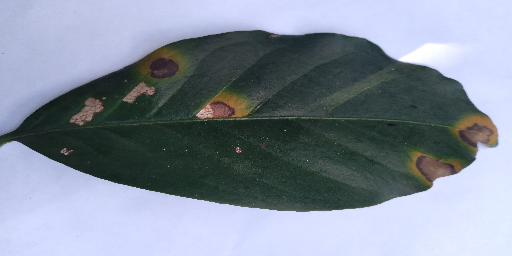

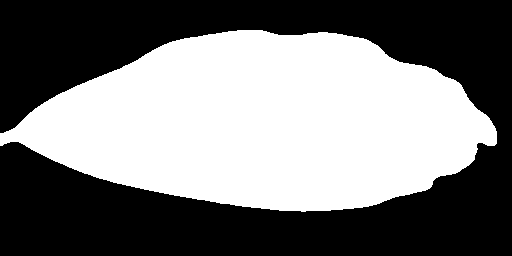

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090104.jpg


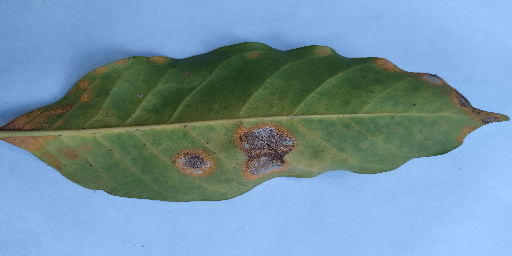

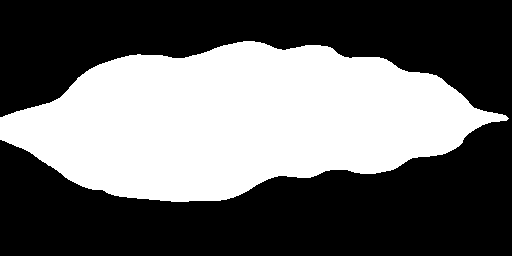

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090116.jpg


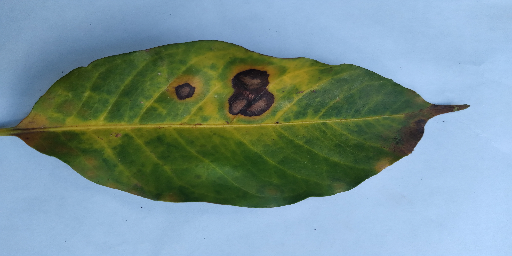

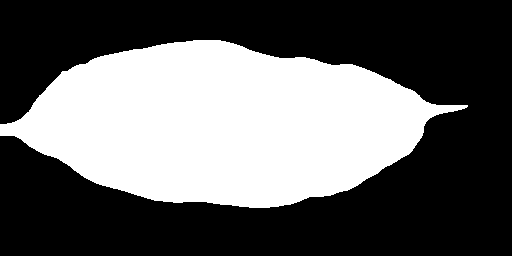

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090130.jpg


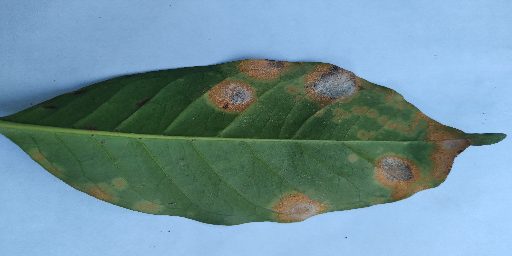

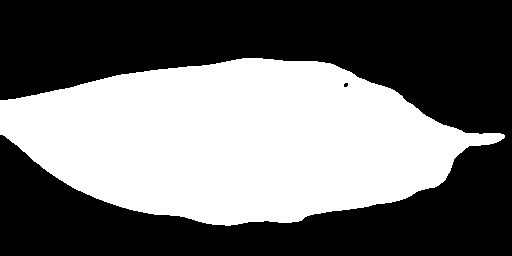

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090139.jpg


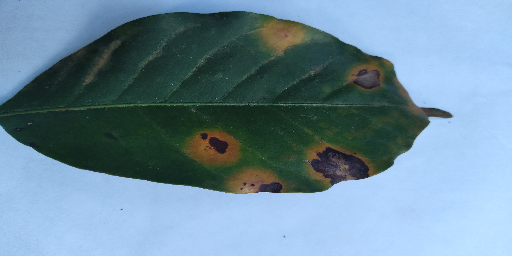

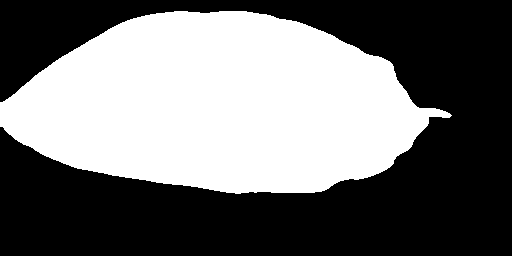

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090142.jpg


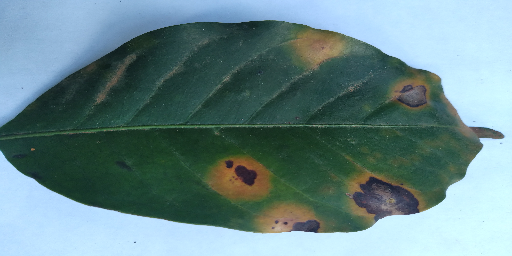

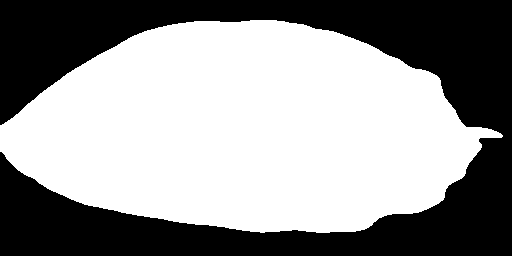

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/90222.jpg


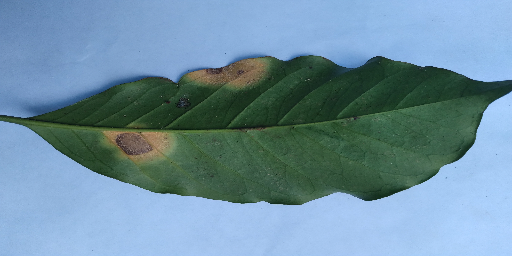

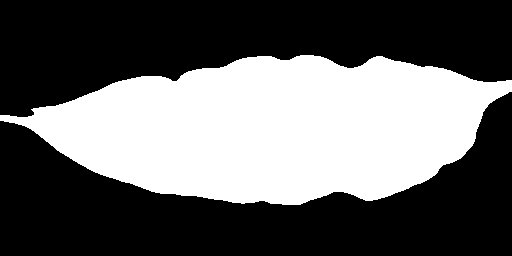

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/90240.jpg


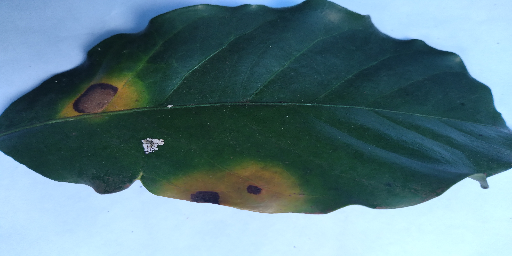

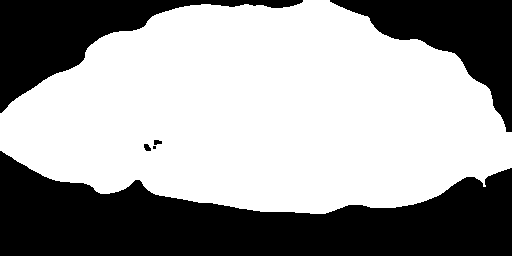

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/90313.jpg


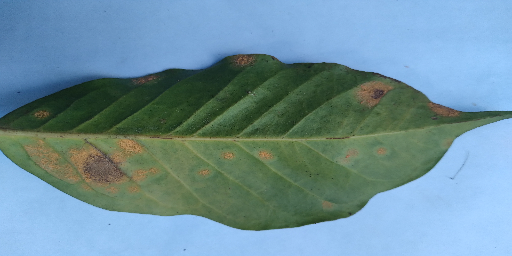

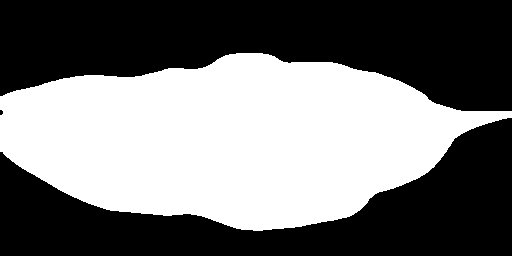

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090331.jpg


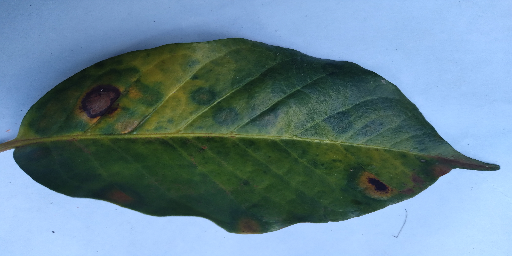

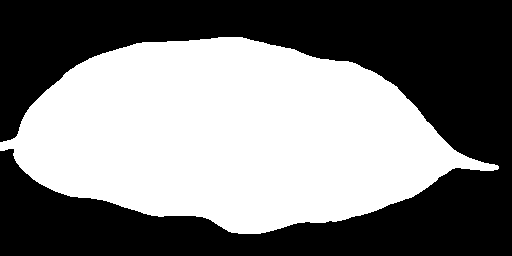

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090349.jpg


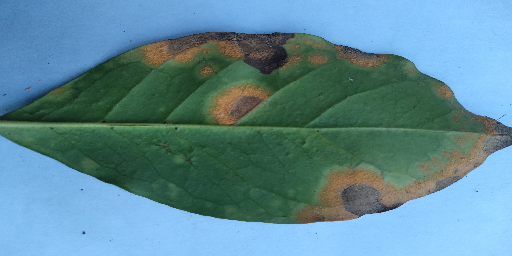

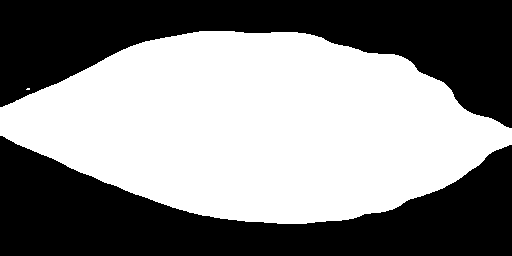

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090402.jpg


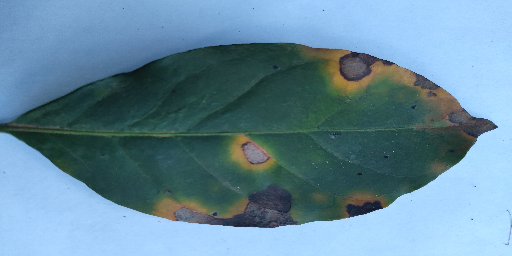

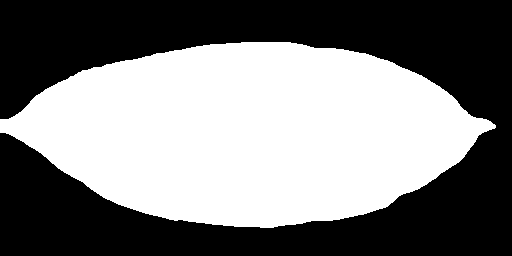

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090417.jpg


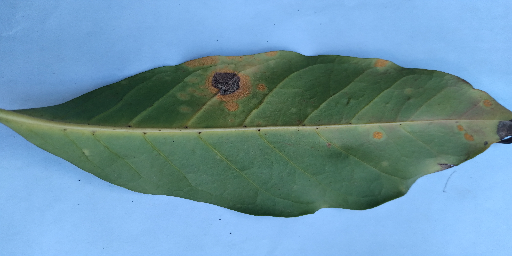

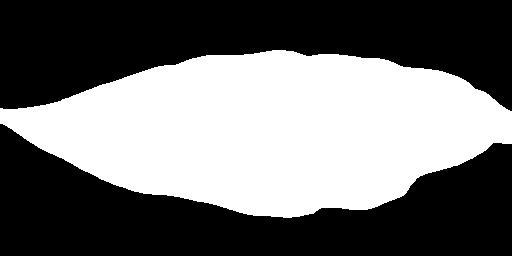

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090430.jpg


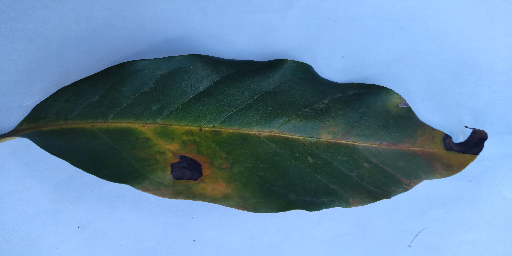

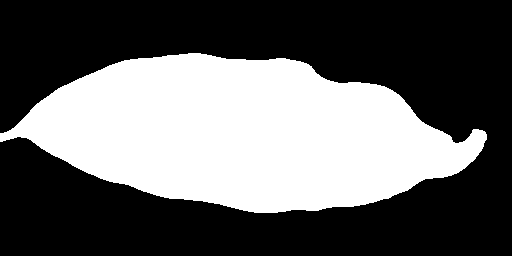

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090443.jpg


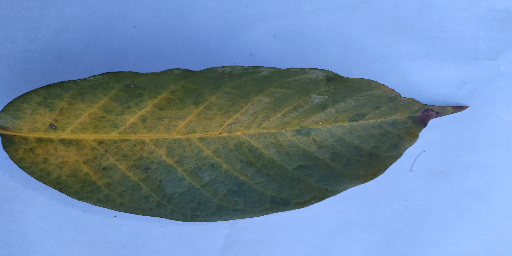

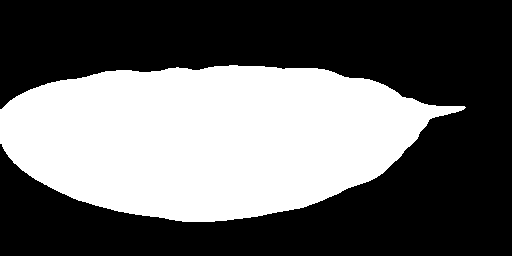

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090456.jpg


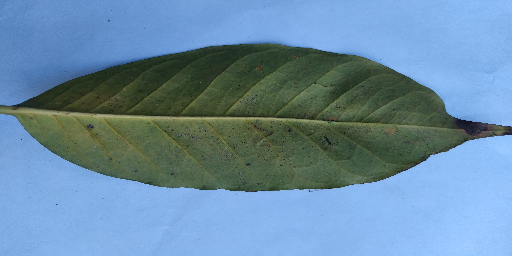

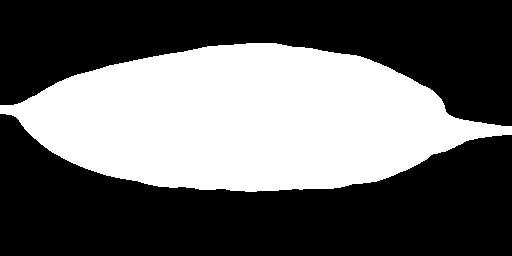

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090506.jpg


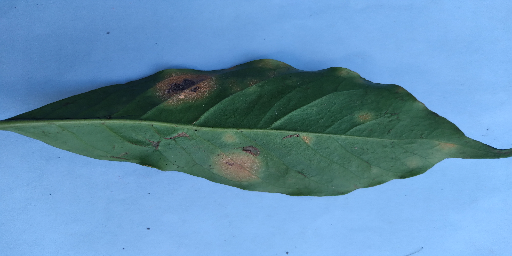

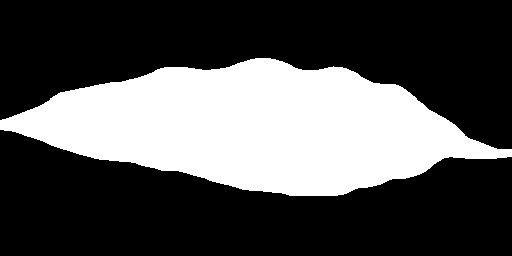

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090516.jpg


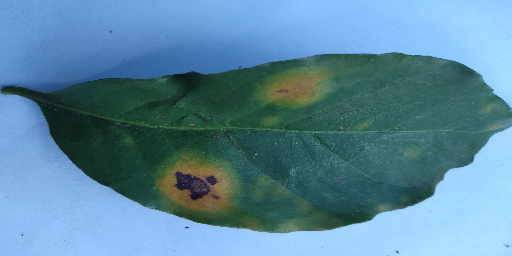

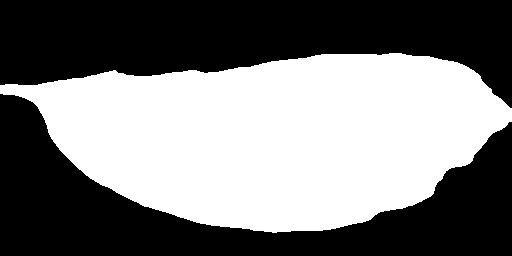

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090530.jpg


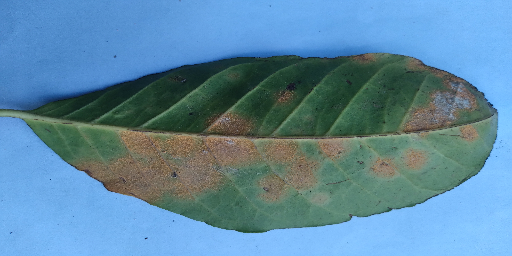

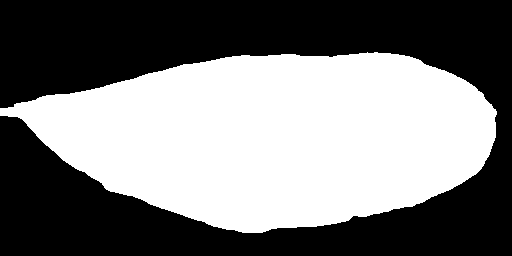

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/90538.jpg


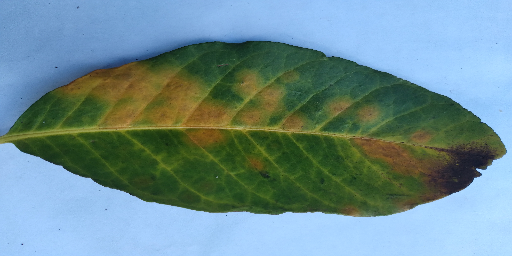

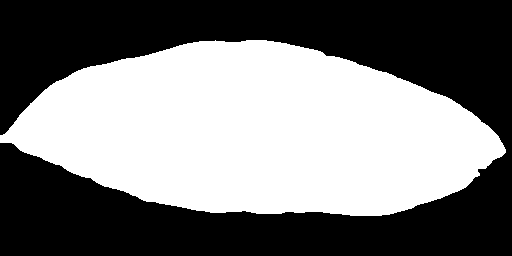

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090553.jpg


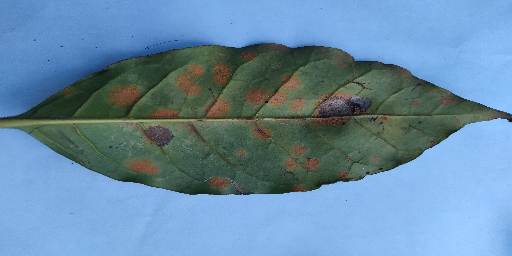

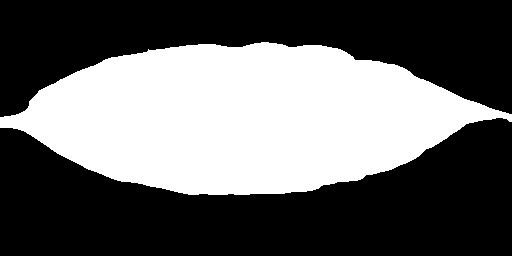

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090602.jpg


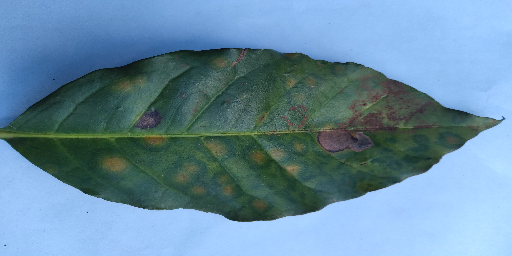

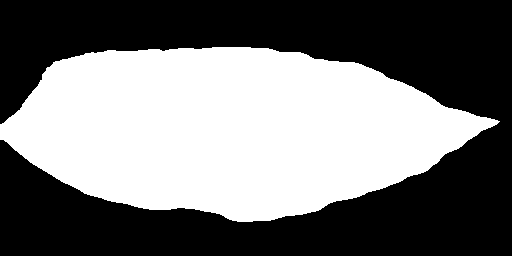

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090614.jpg


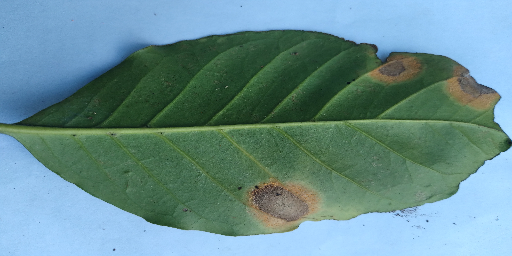

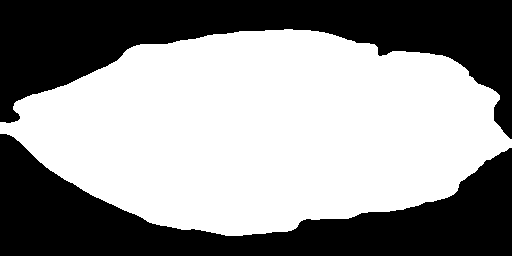

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090624.jpg


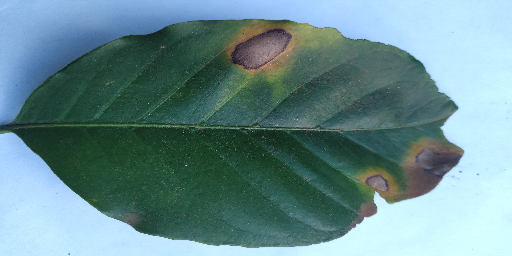

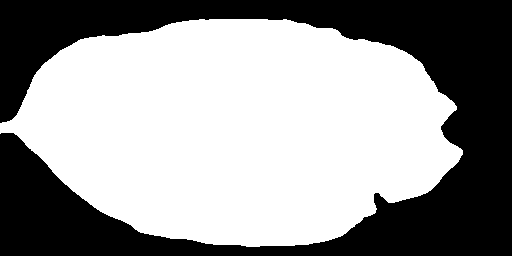

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090642.jpg


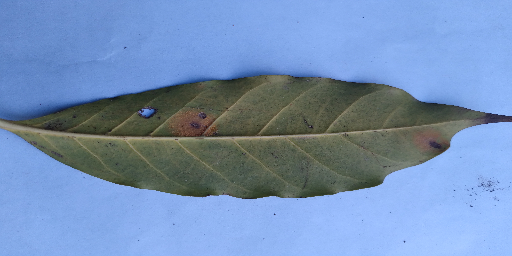

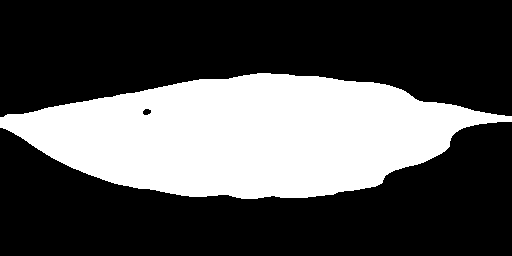

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090656.jpg


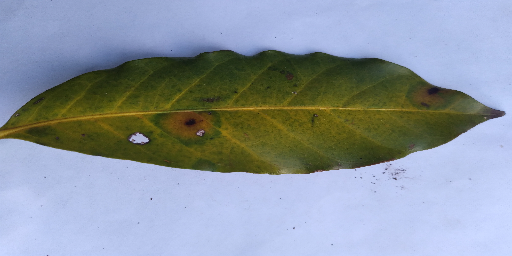

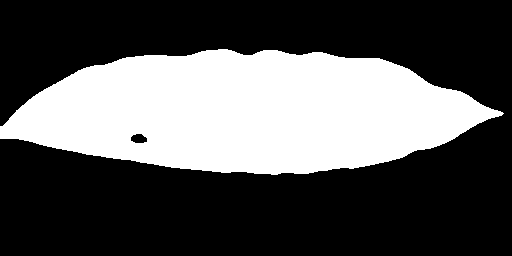

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090710.jpg


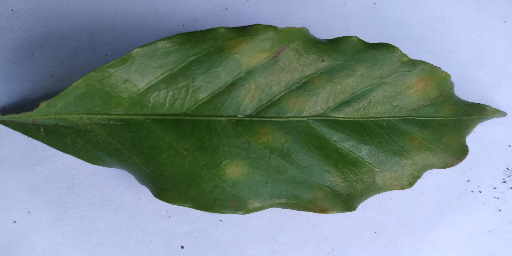

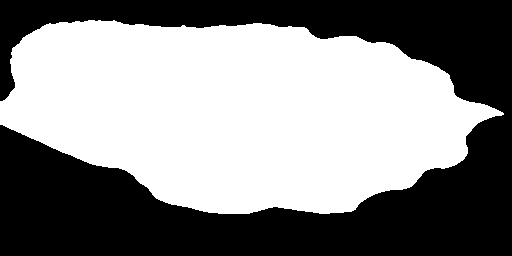

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090724.jpg


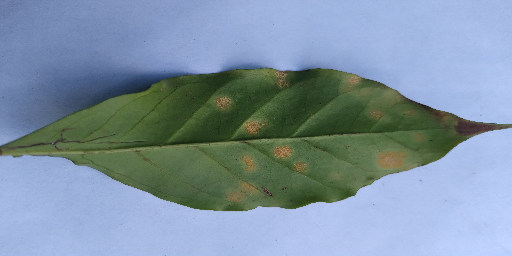

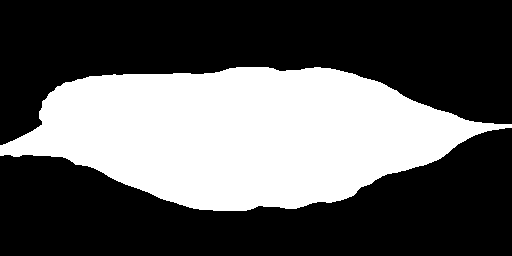

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090743.jpg


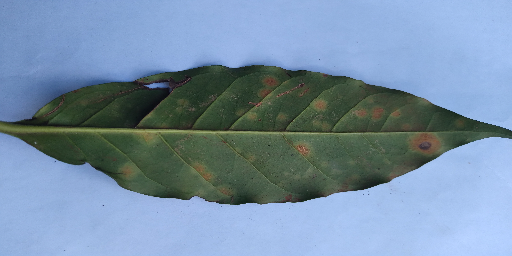

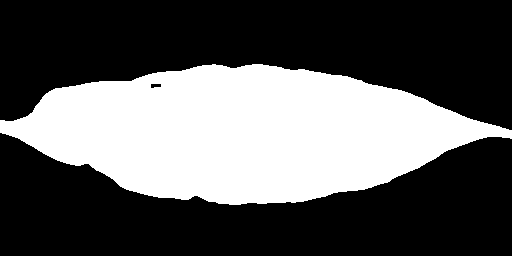

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090755.jpg


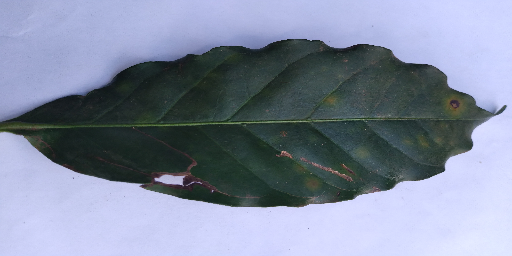

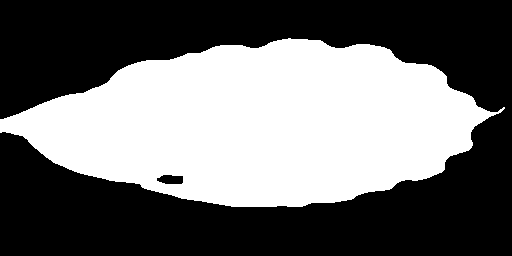

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090815.jpg


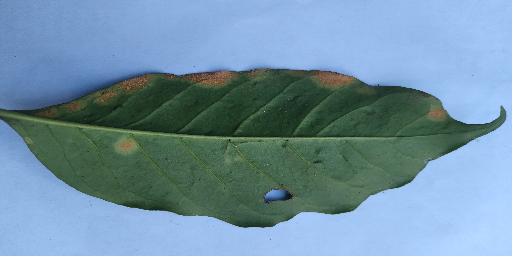

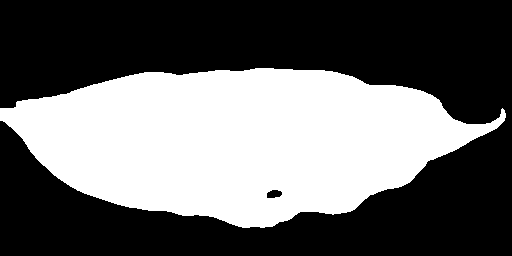

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090827.jpg


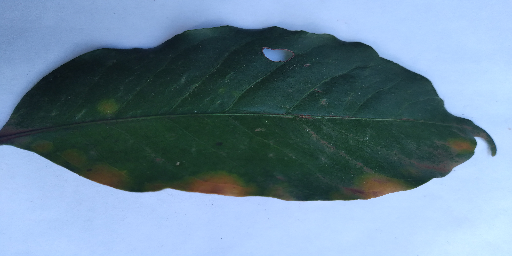

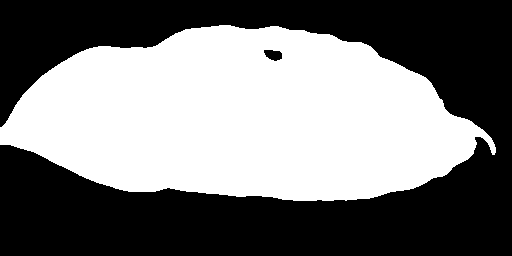

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090844.jpg


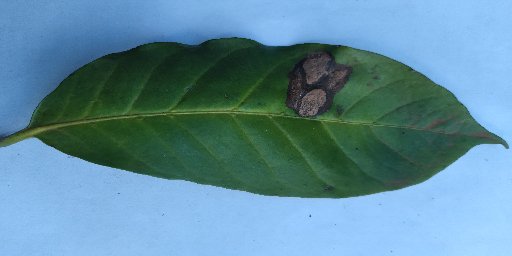

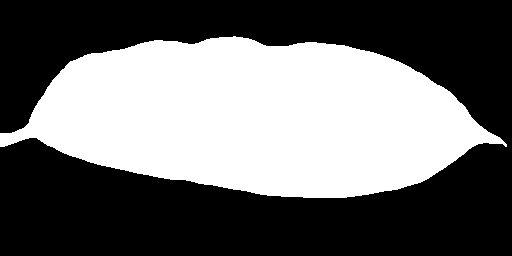

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090853.jpg


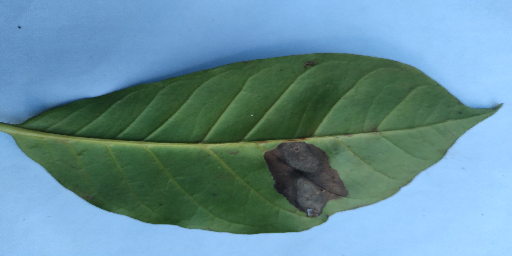

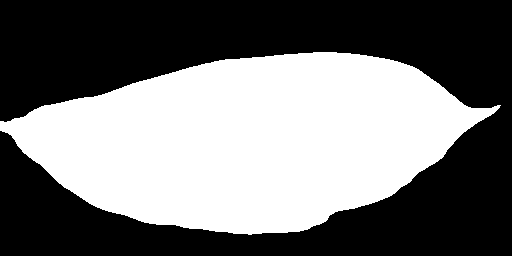

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/90917.jpg


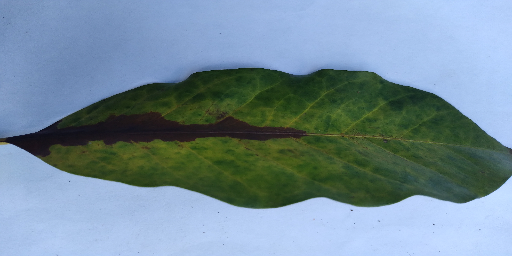

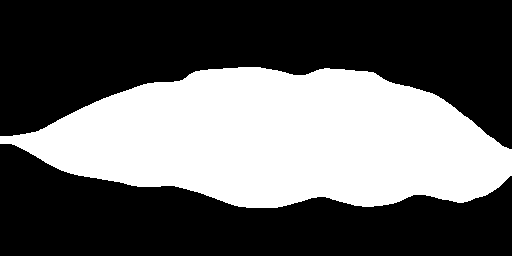

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/090927.jpg


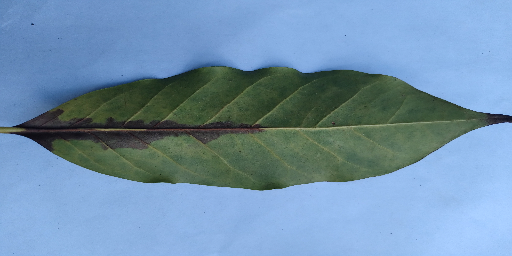

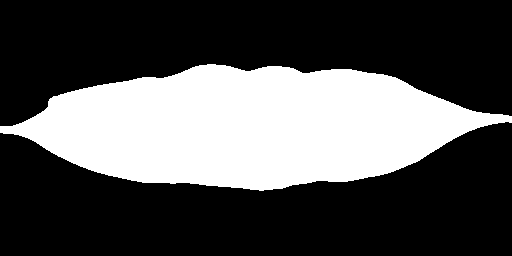

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/90941.jpg


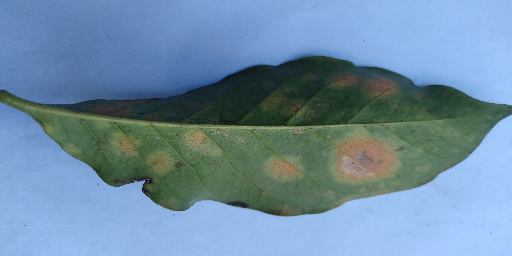

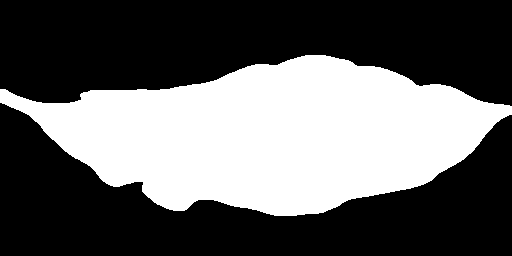

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/91003.jpg


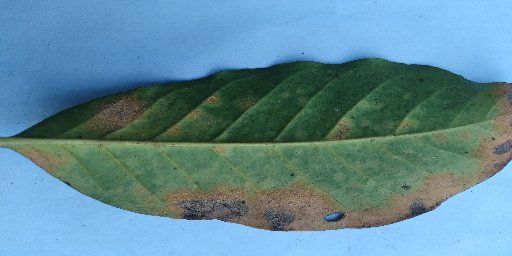

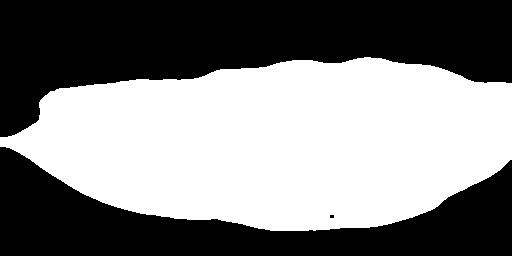

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/91012.jpg


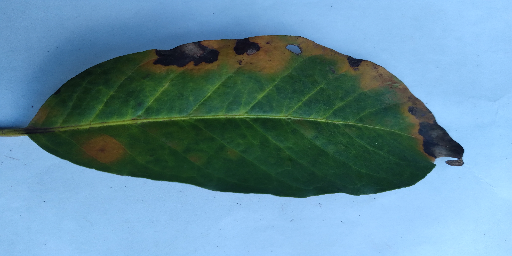

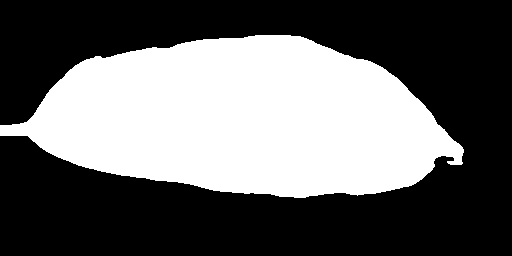

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/091033.jpg


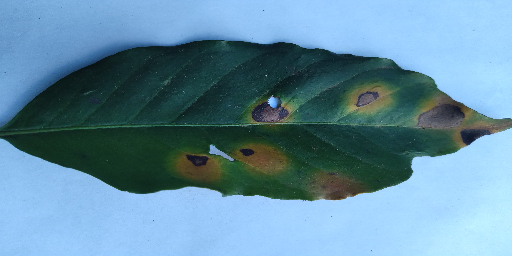

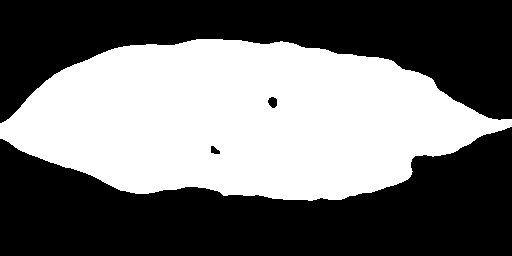

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/091048.jpg


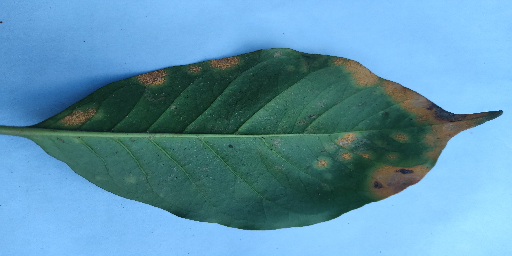

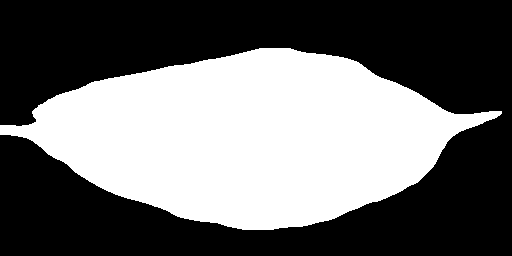

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/91100.jpg


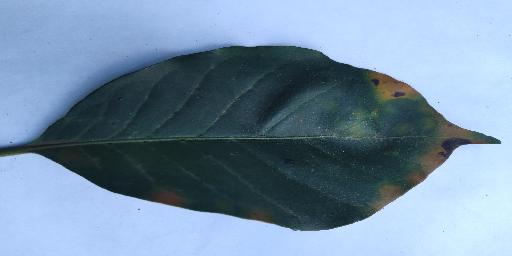

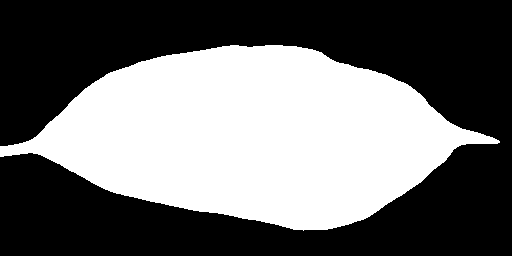

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/91134.jpg


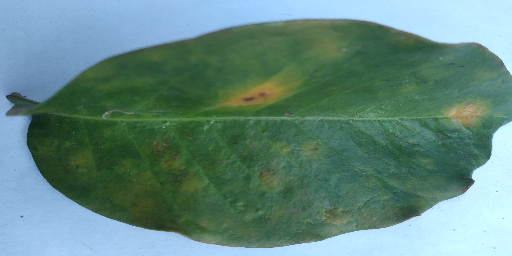

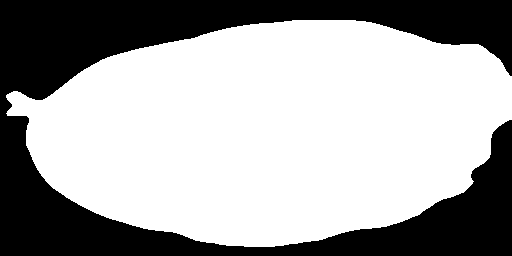

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/91154.jpg


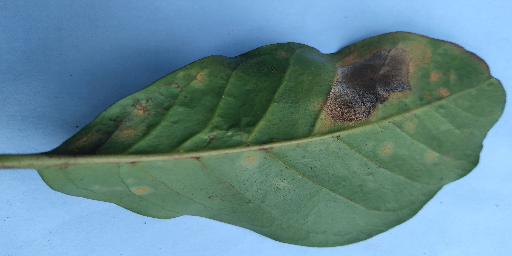

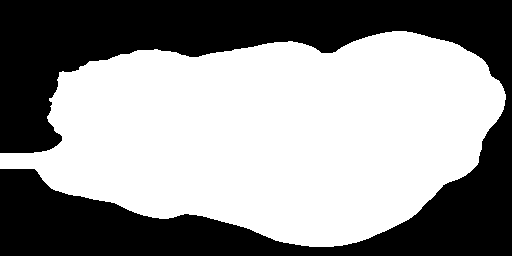

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/91217.jpg


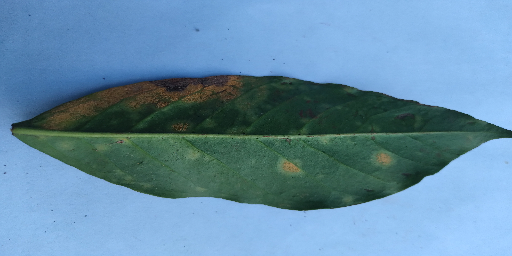

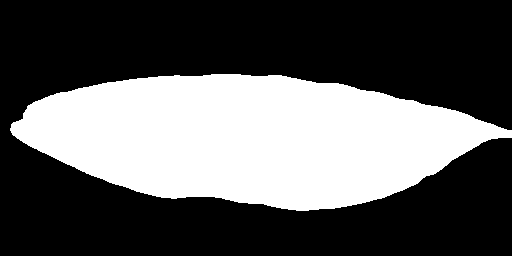

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/91228.jpg


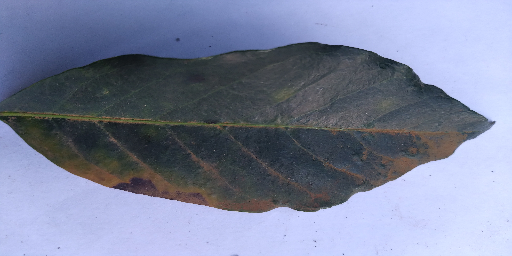

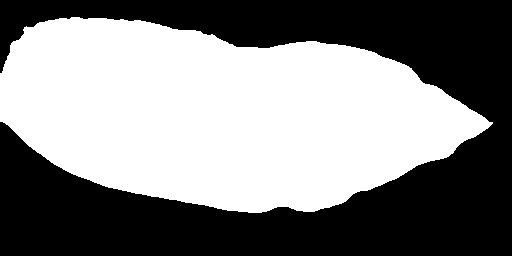

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/091255.jpg


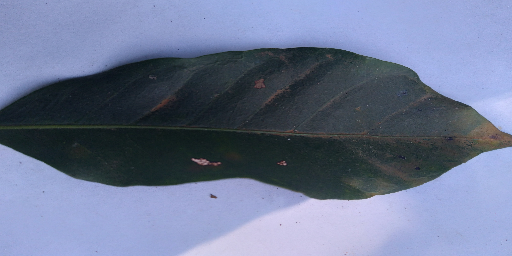

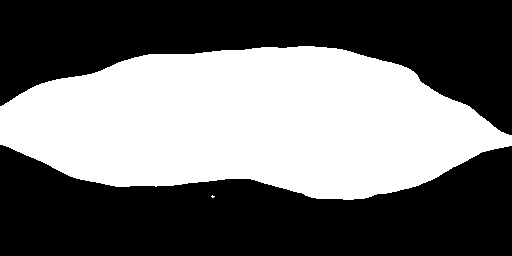

/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/091307.jpg


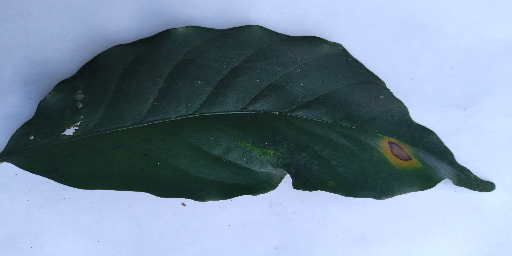

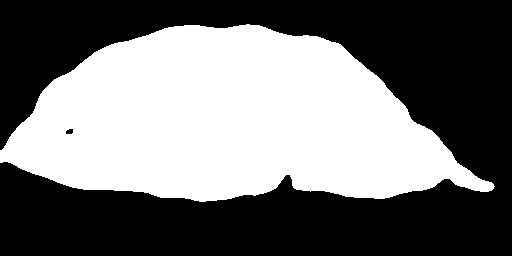

In [ ]:
for root,dirs,files in os.walk("/content/drive/MyDrive/coffee_test_annotations"):
  for file in files:
    a=file.split(".")
    if a[1]=="jpg":
      image_path=os.path.join("/content/drive/MyDrive/coffee_test_annotations/coffee_test_annotations/",file)
      print(image_path)
      segment=segment_threshold(image_path)
      segment=dilation(segment,1,(3,3))
      segment=erosion(segment,1,(3,3))
      
      image=cv2.imread(image_path)
      image = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
      image=cv2.resize(image,(512,256))
      cv2_imshow(image)
      cv2_imshow(segment)